

<Body>   
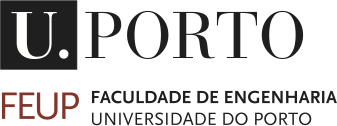   
<h1> <b>VCOMP - Assignment 2  - 2024/2025 </b> </h1>

</Body>  

###António Lopes - up202006725
###Joana Silva - up202006241

Faz no terminal uma vez na primeira vez que correres

pip install torch

pip install torch_snippets

pip install torchvision

pip install scikit-learn

In [36]:
#Import the relevant packages:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
from torch_snippets import *
import torchvision
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split
import cv2
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import zipfile
import shutil

In [2]:
# Define your execution device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("The model will be running on", device, "device")

The model will be running on cuda:0 device


### Download só no colab aqui ja tem o data set na pasta

### UNZIP

In [7]:
import os
import zipfile

# Get the current working directory (where the script is running)
folder_path = os.getcwd()

# Create a directory to store extracted files
output_folder = os.path.join(folder_path, "extracted_files")
os.makedirs(output_folder, exist_ok=True)

# Iterate over all files in the folder
for filename in os.listdir(folder_path):
    # Check if the file is a .zip file
    if filename.endswith('.zip'):
        zip_path = os.path.join(folder_path, filename)
        print(f"Processing: {filename}")
        
        # Open and extract the zip file
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            # Extract directly into the output folder
            zip_ref.extractall(output_folder)
            print(f"Extracted {filename} into {output_folder}")

print(f"All .zip files in {folder_path} have been processed.")

Processing: fifish_durius_2023-09-27_1.zip
Extracted fifish_durius_2023-09-27_1.zip into /home/ajgl/Documents/GitHub/assign2/extracted_files
Processing: kame_durius_2023_10_12.zip
Extracted kame_durius_2023_10_12.zip into /home/ajgl/Documents/GitHub/assign2/extracted_files
Processing: fifish_durius_2023-09-27_3.zip
Extracted fifish_durius_2023-09-27_3.zip into /home/ajgl/Documents/GitHub/assign2/extracted_files
Processing: kame_durius_2023_07_05.zip
Extracted kame_durius_2023_07_05.zip into /home/ajgl/Documents/GitHub/assign2/extracted_files
Processing: kame_cras_pool_2023-09-18.zip
Extracted kame_cras_pool_2023-09-18.zip into /home/ajgl/Documents/GitHub/assign2/extracted_files
Processing: kame_durius_2023_09_26.zip
Extracted kame_durius_2023_09_26.zip into /home/ajgl/Documents/GitHub/assign2/extracted_files
Processing: sample.zip
Extracted sample.zip into /home/ajgl/Documents/GitHub/assign2/extracted_files
Processing: kame_cras_pool_2023-11-08.zip
Extracted kame_cras_pool_2023-11-08.z

### Correct the Dataset

In [ ]:
folder_path = os.getcwd()

# Specify the folder path
folder_path = folder_path + "/extracted_files/Kame_CRAS_Pool_2023-09-18" 

# Remove the folder '2023_11_08'
folder_to_remove = os.path.join(folder_path, "2023_11_08")
if os.path.exists(folder_to_remove) and os.path.isdir(folder_to_remove):
    shutil.rmtree(folder_to_remove)
    print(f"Removed folder: {folder_to_remove}")
else:
    print(f"Folder {folder_to_remove} does not exist.")

# Extract contents of '2023_09_18' (or similar) out of its folder
folder_to_extract = os.path.join(folder_path, "2023_09_18")
if os.path.exists(folder_to_extract) and os.path.isdir(folder_to_extract):
    for item in os.listdir(folder_to_extract):
        item_path = os.path.join(folder_to_extract, item)
        target_path = os.path.join(folder_path, item)
        
        # Move files and folders to the main directory
        shutil.move(item_path, target_path)
        print(f"Moved: {item_path} to {target_path}")
    
    # Remove the now-empty folder
    os.rmdir(folder_to_extract)
    print(f"Removed empty folder: {folder_to_extract}")
else:
    print(f"Folder {folder_to_extract} does not exist.")


Folder /home/ajgl/Documents/GitHub/assign2/extracted_files/Kame_CRAS_Pool_2023-09-18/2023_11_08 does not exist.
Folder /home/ajgl/Documents/GitHub/assign2/extracted_files/Kame_CRAS_Pool_2023-09-18/2023_09_18 does not exist.


### Show sample images detection of anodes

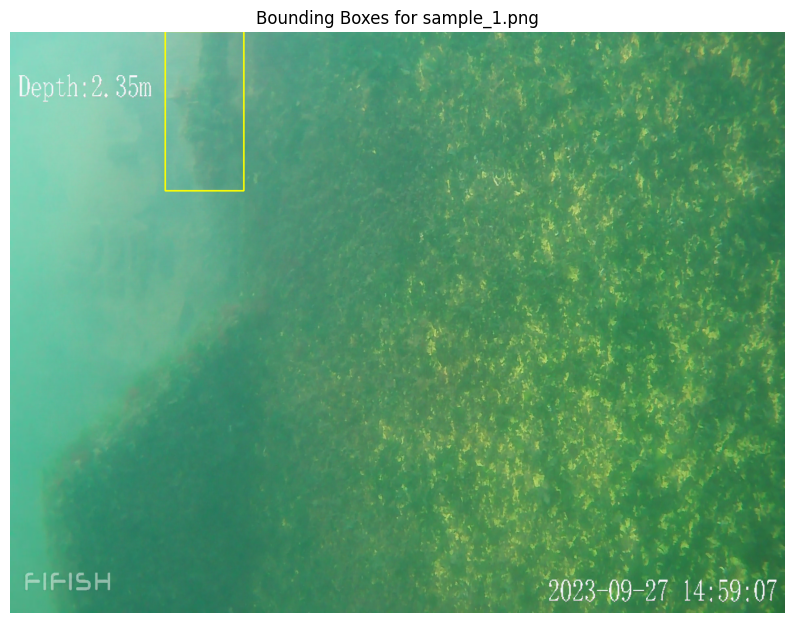

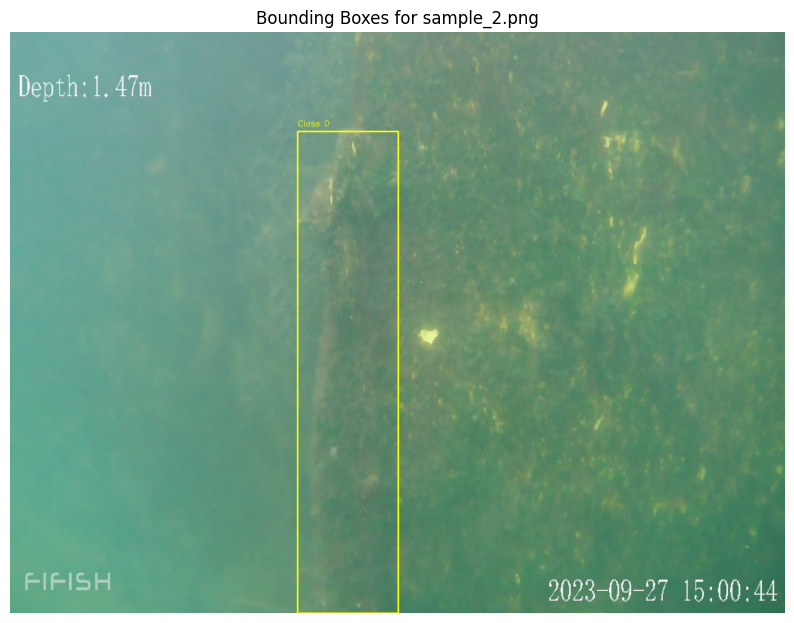

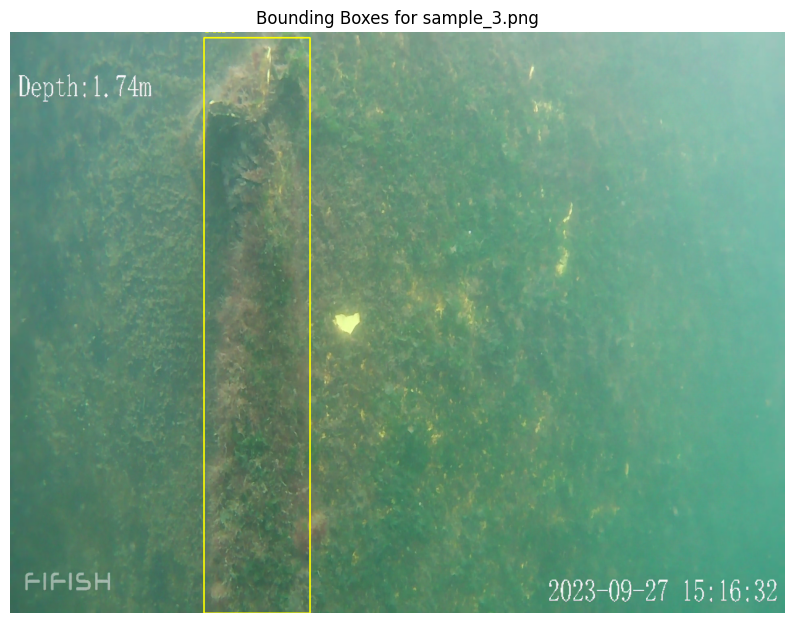

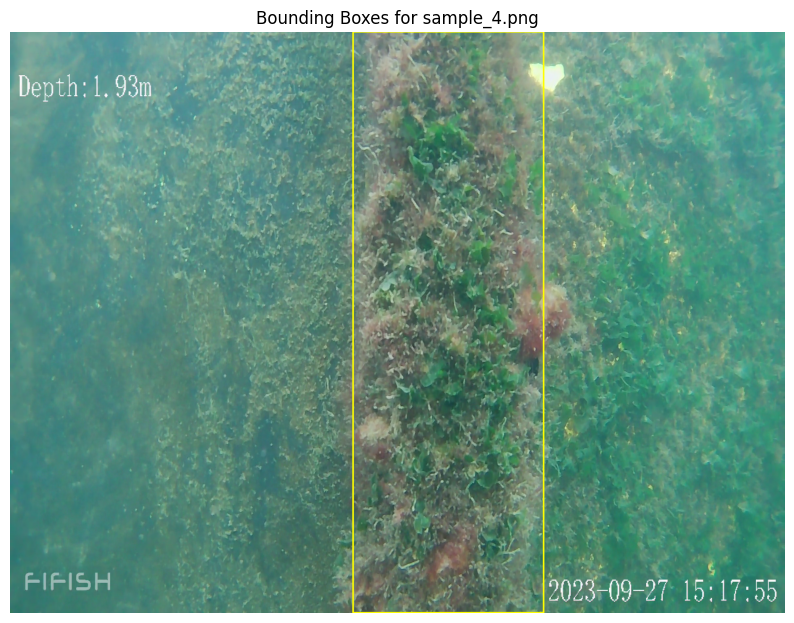

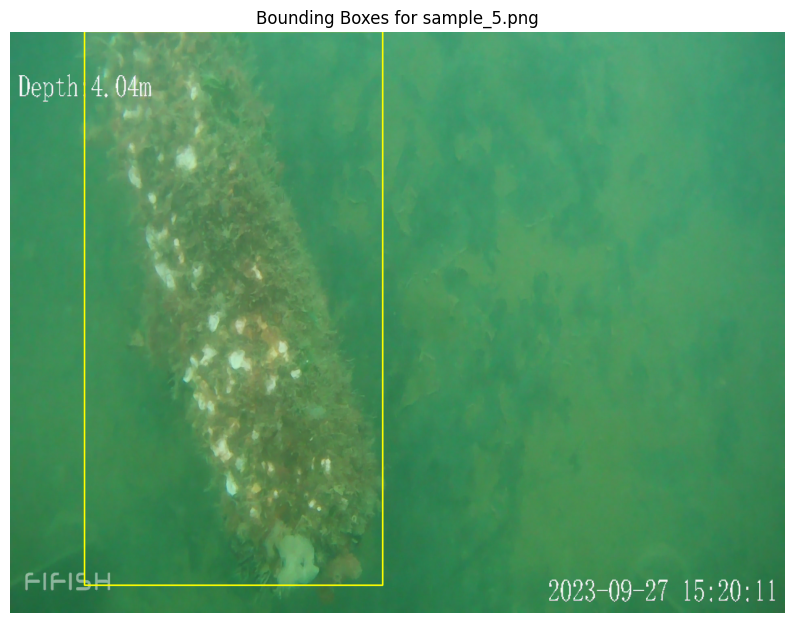

...

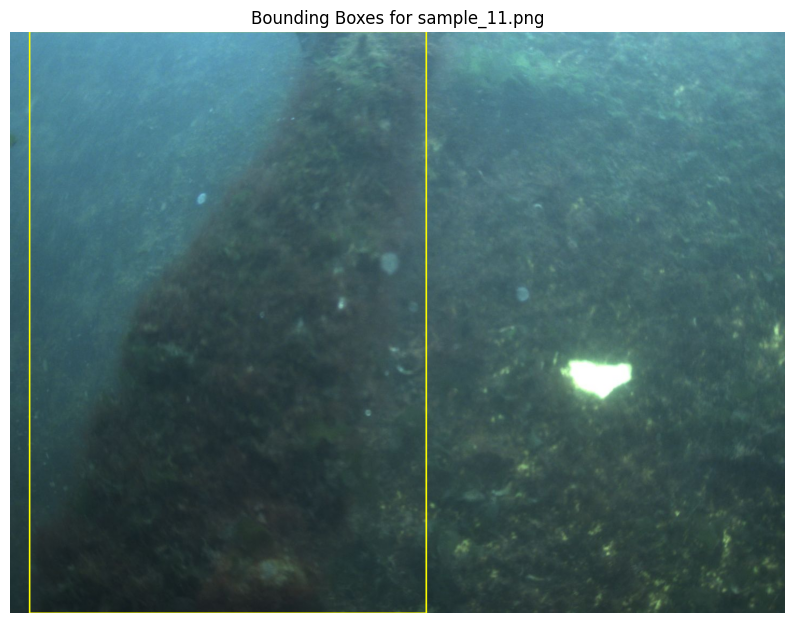

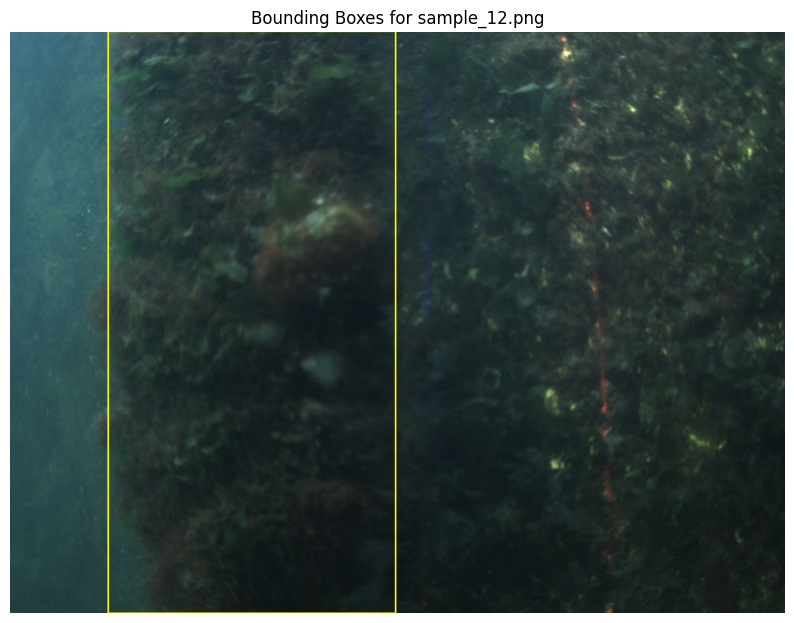

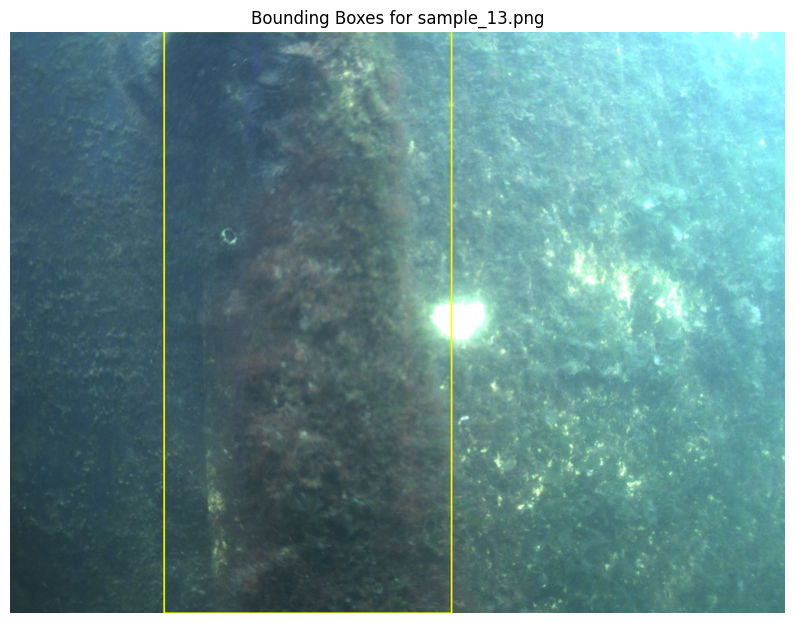

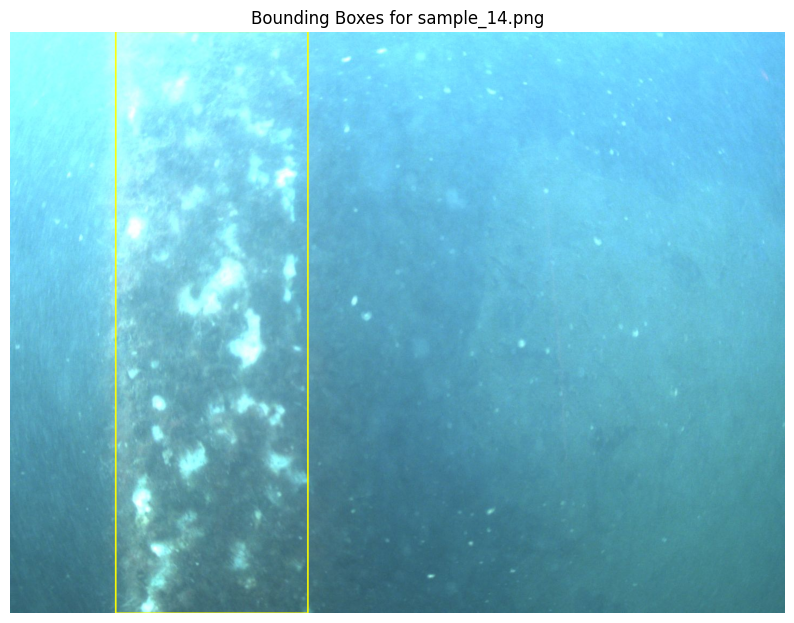

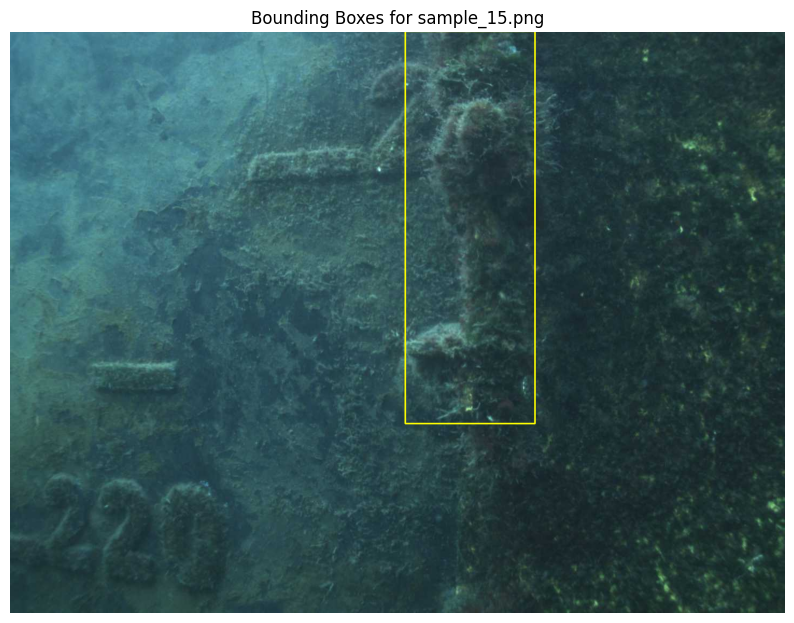

In [19]:
import os
import cv2
import matplotlib.pyplot as plt

# Get the current working directory
folder_path = os.getcwd()

# Specify the path to the Sample folder
sample_folder = os.path.join(folder_path, "extracted_files/Sample")

# Define the paths for images and labels
image_folder = os.path.join(sample_folder, "images")  # Adjust folder name if different
label_folder = os.path.join(sample_folder, "labels")  # Adjust folder name if different

# Helper function to sort files numerically
def numerical_sort(file_list):
    return sorted(file_list, key=lambda x: int(x.split('_')[-1].split('.')[0]))

# Get sorted lists of image and label files
image_files = numerical_sort([f for f in os.listdir(image_folder) if f.startswith("sample_") and f.endswith(".png")])
label_files = numerical_sort([f for f in os.listdir(label_folder) if f.startswith("sample_") and f.endswith(".txt")])

# Iterate through sorted image and label files
for image_file, label_file in zip(image_files, label_files):
    image_path = os.path.join(image_folder, image_file)
    label_path = os.path.join(label_folder, label_file)
    
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image not found: {image_path}")
        continue

    # Read the corresponding label file
    with open(label_path, "r") as file:
        for line in file.readlines():
            values = line.split()
            class_id = int(values[0])  # Classification ID
            x_center, y_center, width, height = map(float, values[1:])

            # Convert from normalized (YOLO format) to image pixel coordinates
            img_h, img_w, _ = image.shape
            x_center *= img_w
            y_center *= img_h
            width *= img_w
            height *= img_h

            # Calculate bounding box coordinates
            x_min = int(x_center - width / 2)
            y_min = int(y_center - height / 2)
            x_max = int(x_center + width / 2)
            y_max = int(y_center + height / 2)

            # Draw the bounding box
            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 255), 2)  # Bounding box in cyan color
            # Add class label
            cv2.putText(image, f"Class {class_id}", (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 1)

    # Convert the image from BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Display the image
    plt.figure(figsize=(10, 8))
    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title(f"Bounding Boxes for {image_file}")
    plt.show()


### Data Augmentation

In [34]:
def get_transforms():
  return transforms.Compose([
                             transforms.ToTensor(),
                             transforms.Normalize(
                                 [0.485, 0.456, 0.406],
                                 [0.229, 0.224, 0.225]
                                 ) # for imagenet
                             ])
tfms = get_transforms()

### Create the datasets

In [37]:
class PoolDataset(data.Dataset):
    def __init__(self, split, transforms):
      	# Specify the folder that contains images in the dataset
        self.transforms = transforms
        self.image_folder = image_folder
        self.label_folder = label_folder
        self.split = split
        self.items = []

    def __len__(self):
        # return the number of total samples contained in the dataset
        return len(self.items)

    def __getitem__(self, index):
        # get the image and label file paths
        image_path = self.items[index][0]
        label_path = image_path.replace("images", "labels").replace(".png", ".txt")

        # Read the image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Read the label file
        with open(label_path, "r") as file:
            for line in file.readlines():
                values = line.split()
                class_id = int(values[0])

                # Convert from normalized (YOLO format) to image pixel coordinates
                x_center, y_center, width, height = map(float, values[1:])
                img_h, img_w, _ = image.shape
                x_center *= img_w
                y_center *= img_h
                width *= img_w
                height *= img_h
                
                # Calculate bounding box coordinates
                x_min = int(x_center - width / 2)
                y_min = int(y_center - height / 2)
                x_max = int(x_center + width / 2)
                y_max = int(y_center + height / 2)

                # Draw the bounding box
                cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 255), 2)
                # Add class label
                cv2.putText(image, f"Class {class_id}", (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 1)
        return image

### Create Model

In [39]:
class Network(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

model = Network()